# Functional Programming: Rudimentary Statistics and Analytics

## Building a Function
| New Concepts | Description |
| --- | --- |
| _return obj_ (from function) | Functions may return an object to be saved if a variable is defined by the function i.e., var1 = function(obj1, obj2, . . .)|

In [1]:
# def function_name(object1, object2, . . ., objectn):
    # <operations>

### Total
$\sum_{i=0}^{n-1} x_{i}$

In [2]:
# this is not efficient if we need to do this for many different values
n = 0
total = 0
values = [i for i in range(10)]

print("total\t","value")
for value in values:
    total += value
    print(total,"\t", value)
    
print("final total:", total)

total	 value
0 	 0
1 	 1
3 	 2
6 	 3
10 	 4
15 	 5
21 	 6
28 	 7
36 	 8
45 	 9
final total: 45


In [3]:
def total(lst):
    total_ = 0
    # in original we used the index of the list
    # . . .
    # n = len(lst)
    # for i in range(n)
    for val in lst:
        total_ += val
    return total_
total(values)

45

In [4]:
total([i for i in range(-1000, 10000, 53)])

932984

In [5]:
import random
x1 = [3,6,9,12,15,18,21,24,27,30]
x2 = [random.randint(0,100) for i in range(10)]
total(x1), total(x2)

(165, 551)

## Mean
Let $X_1, X_2,...,X_n$ represent $n$ values from random variables. For a given dataset, useful descriptive statistics of central tendency include mean, median, and mode, which we built as functions in a previous chapter. 

We define the mean of a set of numbers:
$\bar{X} = \frac{\sum_{i=0}^{n-1} x_{i}} {n}$

In [6]:
def mean(lst):
    n = len(lst)
    mean_ =  total(lst) / n
    return mean_
mean(x1), mean(x2)

(16.5, 55.1)

Now let's build the rest of the summary statistical functions
1. median
2. mode
3. variance
4. standard deviation
5. standard error
6. covariance
7. correlation

## Median

In [7]:
# reminder: median is the middle number in a chronological list
# if the list is even, then it is the average of the middle two numbers
def median(lst):
    n = len(lst)
    lst = sorted(lst)
    # two cases: 1. list is odd in length
    # i percent j checks for remainder upon dividing i by j
    if n % 2 != 0:
        middle_index = int((n - 1) / 2)
        median_ = lst[middle_index]
    # 2. list is even in length
    else:
        upper_middle_index = int(n / 2)
        lower_middle_index = upper_middle_index - 1
        # pass slice with two middle values to mean()
        median_ = mean(lst[lower_middle_index: upper_middle_index + 1])
        
    return median_
    
median(x1), median(x2)

(16.5, 51.0)

In [8]:
# transform x1 to be of odd length by removing the last index
median(x1[:-1])

15

In [9]:
sorted(x2)

[9, 18, 41, 50, 51, 51, 65, 79, 89, 98]

## Mode

In [10]:
lst = [1,1,1,2,3,4,5,5,5]
def mode(lst):
    count_dct = {}
    # create entries for each value with 0
    for key in lst:
        count_dct[key] = 0
    # add up each occurance    
    for key in lst:
        count_dct[key] += 1
    # calculate max_count up front
    max_count = max(count_dct.values())
    # now we can compare each count to the max count
    mode_ = []
    for key, count in count_dct.items():
        if count == max_count:
            mode_.append(key)

    return mode_       
    
    return count_dct
mode(lst)

[1, 5]

## Variance

$$ \sigma^2 = \frac{\sum_{i=1}^n (X_i - \bar{X})^2}{n}$$

When we are dealing with a sample, which is a subset of a population of observations, then we divide by $n - 1$, the **Degrees of Freedom**, to unbias the calculation. 

$$DoF = n - 1$$

$$ S^2 = \frac{\sum_{i=1}^n (X_i - \bar{X})^2}{n-1}$$

In [11]:
def variance(lst, sample = True):
    list_mean = mean(lst)
    n = len(lst)
    dof = n - 1
    sum_sq_diff = 0
    
    for val in lst:
        diff = val - list_mean
        sum_sq_diff += (diff) ** 2
#        print(val, list_mean, diff, sum_sq_diff)
    if sample == False:
        variance_ = sum_sq_diff / n
    else:
        variance_ = sum_sq_diff / dof
    return variance_

variance(x1), variance(x1, sample = False)

(82.5, 74.25)

In [12]:
variance(x2), variance(x2, sample = False)

(824.3222222222223, 741.8900000000001)

$sd = \sqrt{S^2}$

In [13]:
def SD(lst, sample = True):
    SD_ = variance(lst, sample) ** (1/2)
    return SD_
SD(x1), SD(x1, sample = False)

(9.082951062292475, 8.616843969807043)

In [14]:
SD(x2), SD(x2, sample = False)

(28.71101221173197, 27.237657755394462)

## Standard Error

In [15]:
def STE(lst, sample = True):
    n = len(lst)
    se = SD(lst, sample) / n ** (1/2)
    
    return se

In [16]:
STE(x1, sample = True), SD(x1, sample = True)

(2.872281323269014, 9.082951062292475)

In [17]:
STE(x2, sample = True), SD(x2, sample = True)

(9.079219251798152, 28.71101221173197)

## Covariance
To calculate covariance, we multiply the sum of the product of the difference between the observed value and the mean of each list for value _i = 1_ through _n = number of observations_:

$cov_{pop}(x,y) = \frac{\sum_{i=0}^{n-1} (x_{i} - x_{mean})(y_{i} - y_{mean})} {n}$

We pass two lists through the covariance() function. As with the _variance()_ and _SD()_ functions, we can take the sample-covariance.

$cov_{sample}(x,y) = \frac{\sum_{i=0}^{n-1} (x_{i} - x_{mean})(y_{i} - y_{mean})} {n - 1}$

In order for covariance to be calculated, it is required that the lists passed to the function are of equal length. So we check this condition with an if statment:

In [18]:
def covariance(lst1, lst2, sample = True):
    mean1 = mean(lst1)
    mean2 = mean(lst2)
    
    cov = 0
    n1 = len(lst1)
    n2 = len(lst2)
    if n1 == n2:
        n = n1
        # sum the product of the differences
        for i in range(n):
            cov += (lst1[i] - mean1) * (lst2[i] - mean2)
        if sample == False:
            cov = cov / n
        else:
            cov = cov / (n - 1)
            
        return cov
    else:
        print("List lengths are not equal")
        print("List1:", n1)
        print("List2:", n2)
        
covariance(x1, x2, sample = True)

-86.49999999999999

In [19]:
covariance(x1[:-1], x2)

List lengths are not equal
List1: 9
List2: 10


$corr(x,y) = \frac{cov_{pop}(x, y)} {\sigma_x \sigma_y}$

In [20]:
def correlation(lst1, lst2):
    cov = covariance(lst1, lst2)
    SD1 = SD(lst1)
    SD2 = SD(lst2)
    corr = cov / (SD1 * SD2)
    
    return corr
correlation(x1, x2)

-0.33169630168773945

In [21]:
x3 = [1 + x * -.5 for x in x1]
x3

[-0.5, -2.0, -3.5, -5.0, -6.5, -8.0, -9.5, -11.0, -12.5, -14.0]

In [22]:
correlation(x1, x3)

-1.0

$skew_{pop}(x,y) = \frac{\sum_{i=0}^{n-1}{(x_{i} - x_{mean})^3}} {n\sigma^3}$


$skew_{sample}(x,y) = \frac{\sum_{i=0}^{n-1}{(x_{i} - x_{mean})^3}} {(n-1)(n-2)\sigma^3}$

In [23]:
def skewness(lst, sample = True):
    mean_ = mean(lst)
    SD_ = SD(lst, sample)
    skew = 0
    n = len (lst)
    for val in lst:
        skew += (val - mean_) ** 3
    skew = skew / (n * SD_ ** 3) if not sample else\
        n * skew / ((n - 1) * (n - 2) * SD_ **3)
    return skew

skewness(x1)

0.0

In [24]:
skewness(x2)

-0.11488439295801567

$kurt_{pop} = \frac{\sum_{i=0}^{n-1} (x_{i} - x_{mean})^4} {n\sigma^4}$

$kurt_{sample} = \frac{n(n+1)\sum_{i=0}^{n-1} (x_{i} - x_{mean})^4} {(n - 1)(n - 2)( n - 3)\sigma^4} - \frac{3(n - 1)^2}{(n - 2)(n - 3)}$

In [25]:
def kurtosis(lst, sample = True):
    mean_ = mean(lst)
    kurt = 0
    SD_ = SD(lst, sample)
    n = len(lst)
    for val in lst:
        kurt += (val - mean_) ** 4
    kurt = kurt / (n * SD_ ** 4) if  sample == False else  n * (n + 1) * kurt / \
    ((n - 1) * (n - 2) * (n - 3) * (SD_ ** 4)) - (3 *(n - 1) ** 2) / ((n - 2) * (n - 3))
    
    return kurt

kurtosis(x1, sample = False)

1.7757575757575759

In [26]:
kurtosis(x2, sample = False)

2.0885633014539873

## Gather Statistics

In [27]:
import pandas as pd
def gather_statistics(df, sample = False, round_dig = 3):
    dct = {key:{} for key in df}
    for key, val in df.items():
        val.dropna(inplace = True)
        dct[key]["mean"] = round(mean(val), round_dig)
        dct[key]["median"] = round(median(val), round_dig)
        dct[key]["variance"] = round(variance(val), round_dig)
        dct[key]["S.D."] = round(SD(val, sample), round_dig)
        dct[key]["Skewness"] = round(skewness(val, sample), round_dig)
        dct[key]["Kurtosis"] = round(kurtosis(val, sample), round_dig)
    stats_df = pd.DataFrame(dct)
    return stats_df
data = pd.DataFrame([x1,x1], index = ["List1", "List2"]).T
gather_statistics(data, sample = False, round_dig = 2)

,List1,List2
mean,16.50,16.50
median,16.50,16.50
variance,82.50,82.50
S.D.,8.62,8.62
Skewness,0.00,0.00
Kurtosis,1.78,1.78


# Fraser Economic Freedom of the World

In [28]:
filename = "efotw-2022-master-index-data-for-researchers-iso.xlsx"
data = pd.read_excel(filename,
                    header = [4],
                    index_col = [3,1])
data

,,Unnamed: 0,ISO Code 2,Countries,Economic Freedom Summary Index,Rank,Quartile,1A Government Consumption,data,1B Transfers and subsidies,data.1,...,Unnamed: 101,Unnamed: 102,Unnamed: 103,Unnamed: 104,Unnamed: 105,Unnamed: 106,Unnamed: 107,Unnamed: 108,Unnamed: 109,Unnamed: 110
ISO Code 3,Year,,,,,,,,,,,,,,,,,,,,,
ALB,2020,NaN,AL,Albania,7.64,26.0,1.0,8.026471,12.710000,6.978202,11.590000,...,2011.00,2012.00,2013.00,2014.00,2015.00,2016.0,2017.0,2018.0,2019.00,2020.00
DZA,2020,NaN,DZ,Algeria,5.12,157.0,4.0,3.102941,29.450000,7.817129,8.511137,...,153.00,153.00,157.00,159.00,159.00,162.0,162.0,162.0,165.00,165.00
AGO,2020,NaN,AO,Angola,5.91,138.0,4.0,7.700000,13.820000,9.702997,1.590000,...,38.25,38.25,39.25,39.75,39.75,40.5,40.5,40.5,41.25,41.25
ARG,2020,NaN,AR,Argentina,4.87,161.0,4.0,5.985294,19.650000,6.493188,13.370000,...,114.75,114.75,117.75,119.25,119.25,121.5,121.5,121.5,123.75,123.75
ARM,2020,NaN,AM,Armenia,7.84,11.0,1.0,6.605882,17.540000,7.223433,10.690000,...,76.50,76.50,78.50,79.50,79.50,81.0,81.0,81.0,82.50,82.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VEN,1970,NaN,VE,"Venezuela, RB",7.19,13.0,1.0,6.602003,17.553191,9.827430,1.133333,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
VNM,1970,NaN,VN,Vietnam,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
YEM,1970,NaN,YE,"Yemen, Rep.",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
file = pd.ExcelFile(filename)
file.sheet_names # see al sheet names

for sheet_name in file.sheet_names:
    print(sheet_name)
    print(pd.read_excel(filename, header = [4],
                       index_col = [3, 1],
                       sheet_name = sheet_name))

EFW Data 2022 Report
                 Unnamed: 0 ISO Code 2      Countries  \
ISO Code 3 Year                                         
ALB        2020         NaN         AL        Albania   
DZA        2020         NaN         DZ        Algeria   
AGO        2020         NaN         AO         Angola   
ARG        2020         NaN         AR      Argentina   
ARM        2020         NaN         AM        Armenia   
...                     ...        ...            ...   
VEN        1970         NaN         VE  Venezuela, RB   
VNM        1970         NaN         VN        Vietnam   
YEM        1970         NaN         YE    Yemen, Rep.   
ZMB        1970         NaN         ZM         Zambia   
ZWE        1970         NaN         ZW       Zimbabwe   

                 Economic Freedom Summary Index   Rank  Quartile  \
ISO Code 3 Year                                                    
ALB        2020                            7.64   26.0       1.0   
DZA        2020                  

In [30]:
# draw the target sheet name from the list of sheet names
sheet_name = file.sheet_names[1]
data = pd.read_excel(filename,
                    sheet_name = sheet_name,
                    index_col = [2,0])
rename = {"Panel Data Summary Index": "Summary",
         "Area 1": "Size of Government",
         "Area 2": "Legal System and Property Rights",
         "Area 3": "Sound Money",
         "Area 4": "Freedom to Trade Internationally",
         "Area 5": "Regulation"}
data.rename(columns = rename, inplace = True)
# choose only a subset of the columns, variables of interest

data

,,ISO_Code_2,World Bank Region,"World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)",Countries,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation,Standard Deviation of the 5 EFW Areas
ISO_Code_3,Year,,,,,,,,,,,
ALB,2020,AL,Europe & Central Asia,UM,Albania,7.640000,7.817077,5.260351,9.788269,8.222499,7.112958,1.652742
DZA,2020,DZ,Middle East & North Africa,LM,Algeria,5.120000,4.409943,4.131760,7.630287,3.639507,5.778953,1.613103
AGO,2020,AO,Sub-Saharan Africa,LM,Angola,5.910000,8.133385,3.705161,6.087996,5.373190,6.227545,1.598854
ARG,2020,AR,Latin America & the Caribbean,UM,Argentina,4.870000,6.483768,4.796454,4.516018,3.086907,5.490538,1.254924
ARM,2020,AM,Europe & Central Asia,UM,Armenia,7.840000,7.975292,6.236215,9.553009,7.692708,7.756333,1.178292
...,...,...,...,...,...,...,...,...,...,...,...,...
VEN,1970,VE,Latin America & the Caribbean,NaN,"Venezuela, RB",7.242943,8.349529,5.003088,9.621851,7.895993,5.209592,2.028426
VNM,1970,VN,East Asia & Pacific,NaN,Vietnam,NaN,NaN,NaN,NaN,NaN,NaN,NaN
YEM,1970,YE,Middle East & North Africa,NaN,"Yemen, Rep.",NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Segue on boolean series, calling subsets of data

In [31]:
income_levels = data.keys()[2]
# access the unique values in the column by calling .unique()
data[income_levels].unique()

array(['UM', 'LM', 'H', 'L', nan, '..'], dtype=object)

In [32]:
high_income_bool = data[income_levels] == "H"
data[high_income_bool]

,,ISO_Code_2,World Bank Region,"World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)",Countries,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation,Standard Deviation of the 5 EFW Areas
ISO_Code_3,Year,,,,,,,,,,,
AUS,2020,AU,East Asia & Pacific,H,Australia,8.040000,6.091321,8.336755,9.557660,7.918387,8.272967,1.250766
AUT,2020,AT,Europe & Central Asia,H,Austria,7.560000,4.929120,8.388811,9.181004,8.094356,7.201705,1.631718
BHS,2020,BS,Latin America & the Caribbean,H,"Bahamas, The",7.020000,8.646436,6.225554,6.804486,5.215014,8.232494,1.418704
BHR,2020,BH,Middle East & North Africa,H,Bahrain,7.470000,7.081093,4.918487,9.429684,8.261121,7.682671,1.671289
BRB,2020,BB,Latin America & the Caribbean,H,Barbados,7.010000,7.324463,5.912525,8.184047,6.018961,7.624463,1.005162
...,...,...,...,...,...,...,...,...,...,...,...,...
SWE,1990,SE,Europe & Central Asia,H,Sweden,7.273645,4.105904,8.206651,8.030525,9.213997,6.810469,1.965798
CHE,1990,CH,Europe & Central Asia,H,Switzerland,8.537019,7.449348,8.851723,9.598746,9.294085,7.431171,1.025263
ARE,1990,AE,Middle East & North Africa,H,United Arab Emirates,6.756066,5.767890,4.101529,7.962369,NaN,7.527121,1.768182


In [33]:
um_income_bool = data[income_levels] == "UM"
data[um_income_bool]

,,ISO_Code_2,World Bank Region,"World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)",Countries,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation,Standard Deviation of the 5 EFW Areas
ISO_Code_3,Year,,,,,,,,,,,
ALB,2020,AL,Europe & Central Asia,UM,Albania,7.640000,7.817077,5.260351,9.788269,8.222499,7.112958,1.652742
ARG,2020,AR,Latin America & the Caribbean,UM,Argentina,4.870000,6.483768,4.796454,4.516018,3.086907,5.490538,1.254924
ARM,2020,AM,Europe & Central Asia,UM,Armenia,7.840000,7.975292,6.236215,9.553009,7.692708,7.756333,1.178292
AZE,2020,AZ,Europe & Central Asia,UM,Azerbaijan,6.210000,4.550381,5.243687,7.268722,7.012122,6.959071,1.226116
BLR,2020,BY,Europe & Central Asia,UM,Belarus,6.830000,5.236437,5.473420,9.163656,7.302753,6.980477,1.586807
...,...,...,...,...,...,...,...,...,...,...,...,...
ZAF,1990,ZA,Sub-Saharan Africa,UM,South Africa,5.807061,6.891035,3.942684,5.876524,6.750809,5.855771,1.176107
SUR,1990,SR,Latin America & the Caribbean,UM,Suriname,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TTO,1990,TT,Latin America & the Caribbean,UM,Trinidad and Tobago,5.621522,6.772555,4.975782,5.996212,2.798939,7.777625,1.903213


In [34]:
# include rows if the income_levels column si either "H" or "UM"
data[high_income_bool | um_income_bool]

,,ISO_Code_2,World Bank Region,"World Bank Current Income Classification, 1990-present (L=Low income, LM=Lower middle income, UM=Upper middle income, H=High income)",Countries,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation,Standard Deviation of the 5 EFW Areas
ISO_Code_3,Year,,,,,,,,,,,
ALB,2020,AL,Europe & Central Asia,UM,Albania,7.640000,7.817077,5.260351,9.788269,8.222499,7.112958,1.652742
ARG,2020,AR,Latin America & the Caribbean,UM,Argentina,4.870000,6.483768,4.796454,4.516018,3.086907,5.490538,1.254924
ARM,2020,AM,Europe & Central Asia,UM,Armenia,7.840000,7.975292,6.236215,9.553009,7.692708,7.756333,1.178292
AUS,2020,AU,East Asia & Pacific,H,Australia,8.040000,6.091321,8.336755,9.557660,7.918387,8.272967,1.250766
AUT,2020,AT,Europe & Central Asia,H,Austria,7.560000,4.929120,8.388811,9.181004,8.094356,7.201705,1.631718
...,...,...,...,...,...,...,...,...,...,...,...,...
ARE,1990,AE,Middle East & North Africa,H,United Arab Emirates,6.756066,5.767890,4.101529,7.962369,NaN,7.527121,1.768182
GBR,1990,GB,Europe & Central Asia,H,United Kingdom,8.200173,6.519684,8.164475,8.482826,9.139436,8.650617,0.998742
USA,1990,US,North America,H,United States,8.461126,7.262163,8.350956,9.669842,8.537828,8.477998,0.853932


In [35]:
data = data[data.keys()[4:-1]]
data

,,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation
ISO_Code_3,Year,,,,,,
ALB,2020,7.640000,7.817077,5.260351,9.788269,8.222499,7.112958
DZA,2020,5.120000,4.409943,4.131760,7.630287,3.639507,5.778953
AGO,2020,5.910000,8.133385,3.705161,6.087996,5.373190,6.227545
ARG,2020,4.870000,6.483768,4.796454,4.516018,3.086907,5.490538
ARM,2020,7.840000,7.975292,6.236215,9.553009,7.692708,7.756333
...,...,...,...,...,...,...,...
VEN,1970,7.242943,8.349529,5.003088,9.621851,7.895993,5.209592
VNM,1970,NaN,NaN,NaN,NaN,NaN,NaN
YEM,1970,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
data_for_stats = data.dropna() # same as (axis = 0, hor = "any")
data_for_stats

,,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation
ISO_Code_3,Year,,,,,,
ALB,2020,7.640000,7.817077,5.260351,9.788269,8.222499,7.112958
DZA,2020,5.120000,4.409943,4.131760,7.630287,3.639507,5.778953
AGO,2020,5.910000,8.133385,3.705161,6.087996,5.373190,6.227545
ARG,2020,4.870000,6.483768,4.796454,4.516018,3.086907,5.490538
ARM,2020,7.840000,7.975292,6.236215,9.553009,7.692708,7.756333
...,...,...,...,...,...,...,...
TUN,1970,5.538385,4.946963,6.340170,6.885720,3.500622,6.225955
TUR,1970,4.277887,5.183333,4.764211,5.476488,0.246240,5.578751
GBR,1970,6.035320,4.622300,7.344851,7.312995,3.981406,7.489366


In [37]:
data.dropna(axis = 1)

,
ISO_Code_3,Year
ALB,2020
DZA,2020
AGO,2020
ARG,2020
ARM,2020
...,...
VEN,1970
VNM,1970
YEM,1970


In [38]:
stats_df = gather_statistics(data_for_stats, sample = False)
stats_df

C:\Users\jacob\AppData\Local\Temp\ipykernel_18056\2169103471.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val.dropna(inplace = True)


,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation
mean,6.635,6.609,5.282,7.813,6.757,6.733
median,6.763,6.650,5.098,8.154,7.013,6.867
variance,1.274,1.466,2.816,3.110,2.874,1.448
S.D.,1.128,1.211,1.678,1.763,1.695,1.203
Skewness,-0.597,-0.136,0.350,-1.312,-0.984,-0.551
Kurtosis,3.176,2.599,2.404,5.412,4.200,3.145


In [39]:
cov_df = data_for_stats.cov().round(2)
cov_df

,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation
Summary,1.27,0.42,1.45,1.67,1.68,1.13
Size of Government,0.42,1.47,-0.25,0.30,0.31,0.25
Legal System and Property Rights,1.45,-0.25,2.82,1.55,1.80,1.31
Sound Money,1.67,0.30,1.55,3.11,2.07,1.28
Freedom to Trade Internationally,1.68,0.31,1.80,2.07,2.87,1.33
Regulation,1.13,0.25,1.31,1.28,1.33,1.45


In [40]:
corr_df = data_for_stats.corr().round(2)
corr_df

,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation
Summary,1.00,0.31,0.76,0.84,0.88,0.83
Size of Government,0.31,1.00,-0.12,0.14,0.15,0.17
Legal System and Property Rights,0.76,-0.12,1.00,0.52,0.63,0.65
Sound Money,0.84,0.14,0.52,1.00,0.69,0.60
Freedom to Trade Internationally,0.88,0.15,0.63,0.69,1.00,0.65
Regulation,0.83,0.17,0.65,0.60,0.65,1.00


In [41]:
# alphabetize the columns
data_for_stats.corr().round(2).sort_index(axis = 1).sort_index(axis = 0)

,Freedom to Trade Internationally,Legal System and Property Rights,Regulation,Size of Government,Sound Money,Summary
Freedom to Trade Internationally,1.00,0.63,0.65,0.15,0.69,0.88
Legal System and Property Rights,0.63,1.00,0.65,-0.12,0.52,0.76
Regulation,0.65,0.65,1.00,0.17,0.60,0.83
Size of Government,0.15,-0.12,0.17,1.00,0.14,0.31
Sound Money,0.69,0.52,0.60,0.14,1.00,0.84
Summary,0.88,0.76,0.83,0.31,0.84,1.00


In-Class Graphs already exists


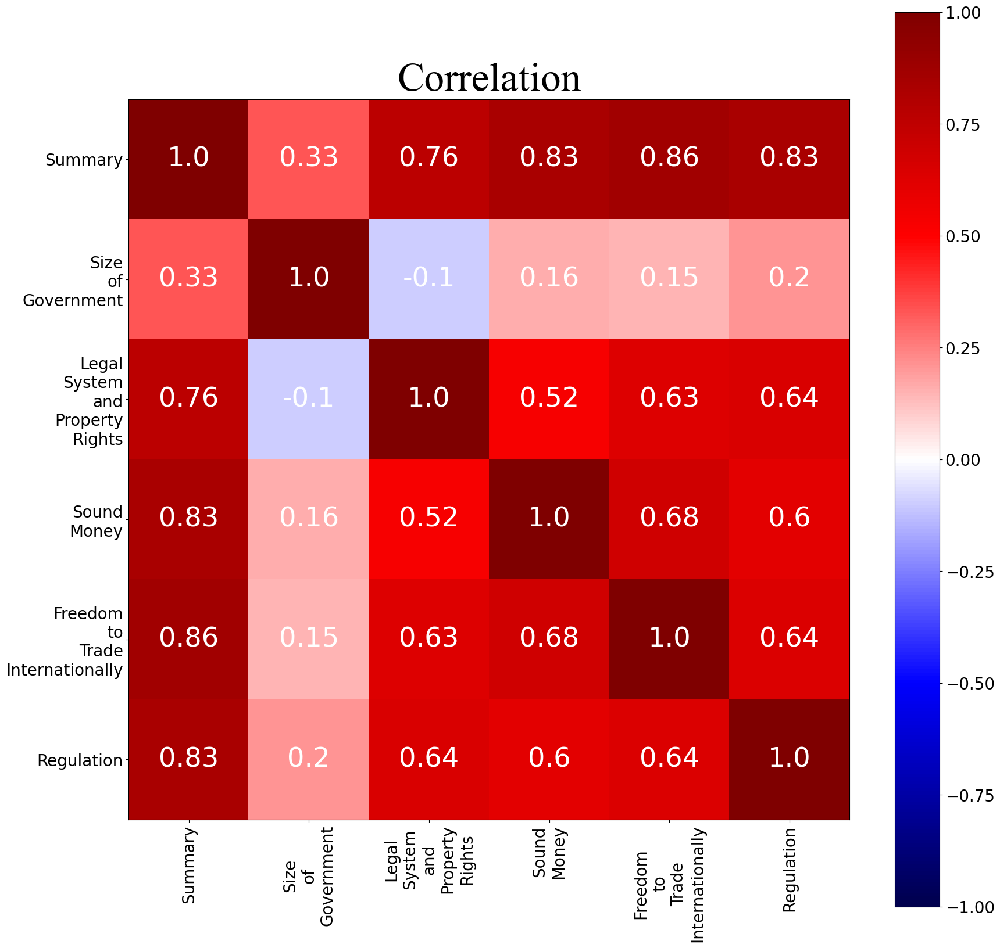

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import os

def corr_matrix_heatmap(data, dim = 20, pp = None):
    fig, ax = plt.subplots(figsize = (dim,dim))
    im = ax.imshow(data, norm = plt.cm.colors.Normalize(-1,1), cmap = "seismic")
    labels = data.keys()
    num_vars = len(labels)
    tick_labels = [label.replace(" ","\n") for label in labels]
    tick_font_size = 120 / num_vars
    val_font_size = 200 / num_vars
    plt.rcParams.update({'font.size': tick_font_size})
    x_ticks = np.arange(num_vars)
    plt.xticks(x_ticks, tick_labels, fontsize = tick_font_size, rotation = 90)
    y_ticks = np.arange(num_vars)
    plt.yticks(y_ticks, tick_labels, fontsize = tick_font_size)
    # put all of the options chosen above to use and create the correaltion
    # figure
    for i in range(len(labels)):
        for j in range(len(labels)):
            text = ax.text(i, j, str(round(data.values[i][j], 2)),
                          fontsize = val_font_size, ha = "center",
                          va = "center", color = "w")
    title_font = {"fontname":"Times New Roman"}  
    plt.title("Correlation", fontsize = 50, **title_font) 
#            print(i, labels[i], j, labels[j])
    cbar = fig.colorbar(im)
    plt.show()
    if pp != None:
        pp.savefig(fig, bbox_inches = "tight")
    plt.close()
    
# create a folder to save graphs as .jpegs
# saves the graphs as .jpegs in a folder in same location as current file

folder = "In-Class Graphs"
try:
    os.mkdir(folder)
except:
    print(folder, "already exists")
    
# create pdf
pp = PdfPages(folder + "/Economic Freedom Plots.pdf")
    
corr_data = data.corr()    
corr_matrix_heatmap(corr_data, pp = pp)

## Building sactter plots with time as horizontal axis

In [43]:
mean_data = data.groupby("Year").mean()
mean_data

,Summary,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation
Year,,,,,,
1970,5.699777,6.115453,4.828106,7.219435,5.142756,5.643092
1975,5.330897,5.638449,4.704443,6.007796,4.904180,5.600009
1980,5.358043,5.474844,4.790720,6.094311,4.946113,5.661589
1985,5.423119,5.477523,4.872785,6.261684,4.982920,5.687262
1990,5.716292,6.061804,4.964320,6.302771,5.617330,5.816249
1995,6.163039,6.497296,5.199571,6.481726,6.832335,6.085262
2000,6.592760,6.628378,5.231726,7.598053,6.984603,6.559508
2001,6.599041,6.668608,5.196628,7.770338,6.982832,6.394464
2002,6.663490,6.662246,5.185988,7.861788,6.997352,6.621917


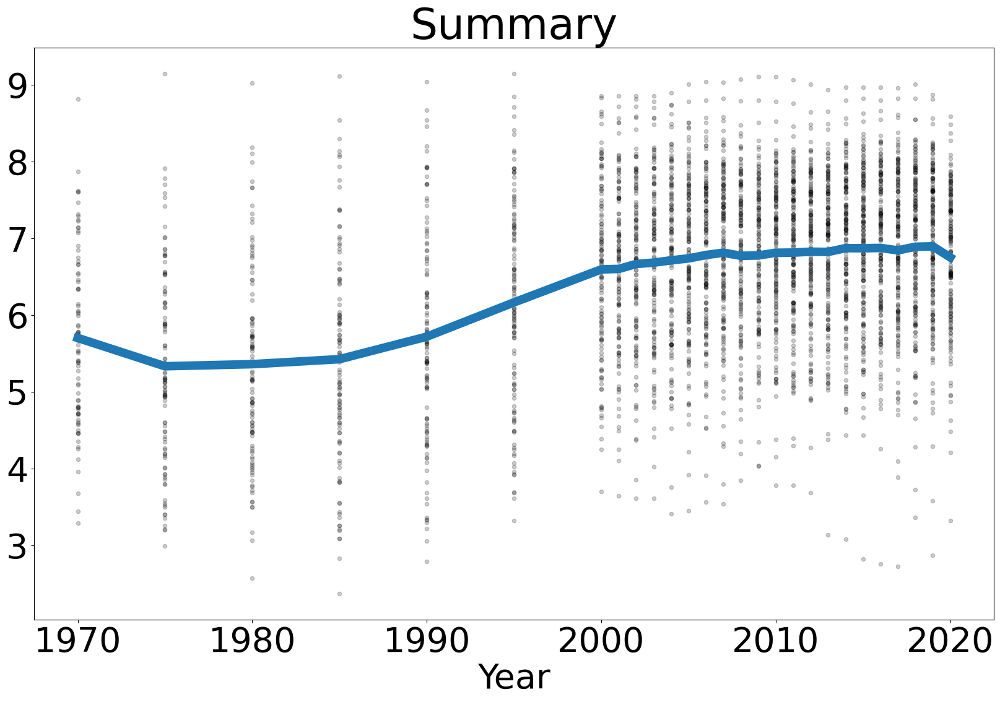

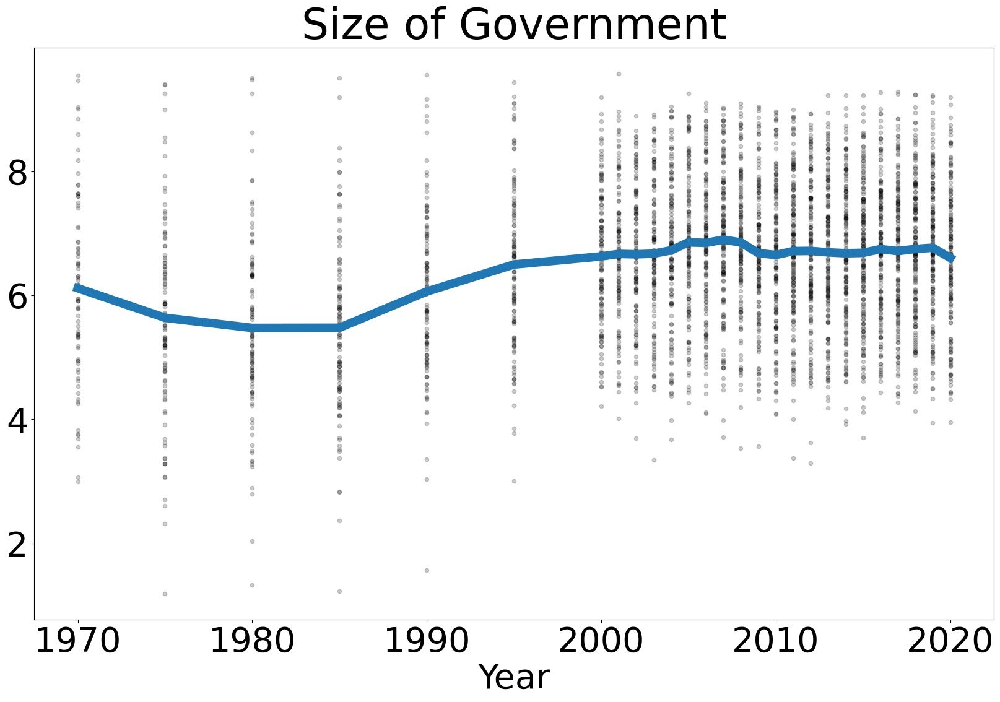

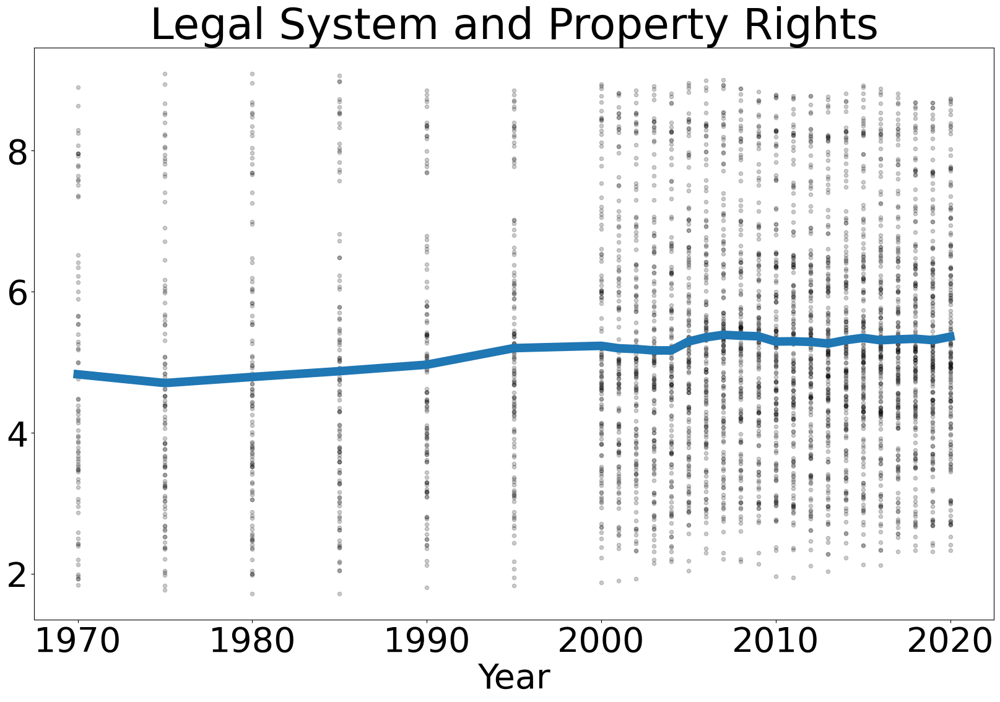

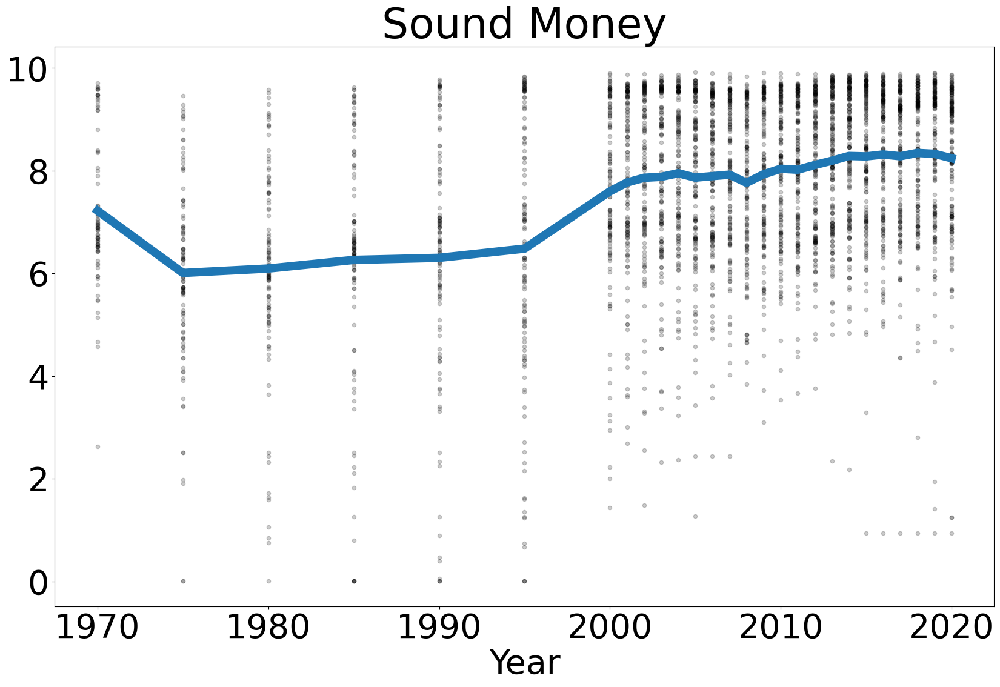

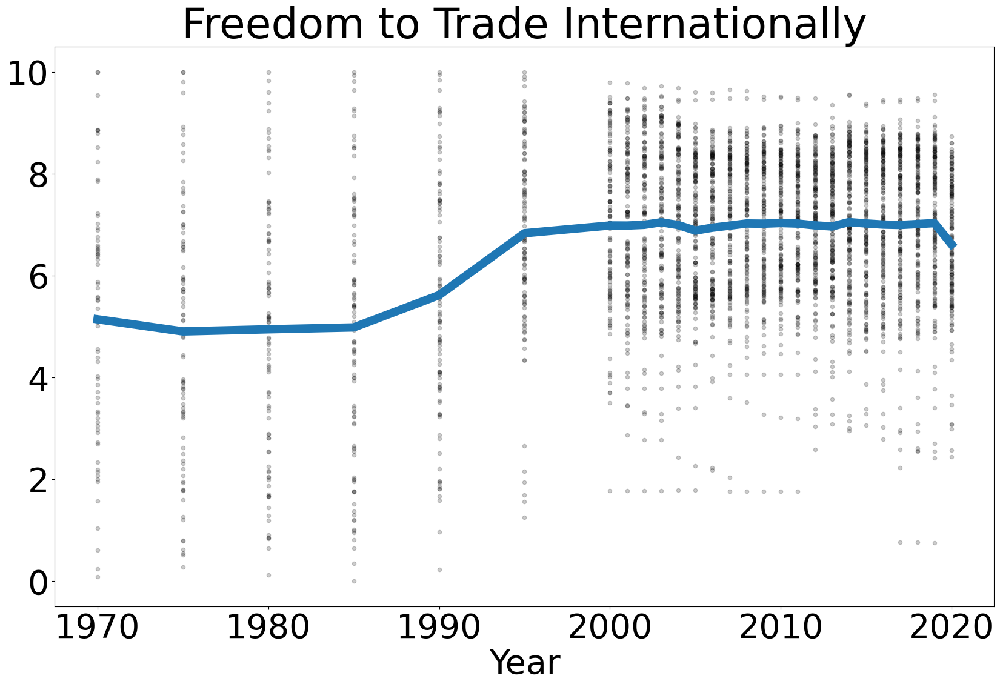

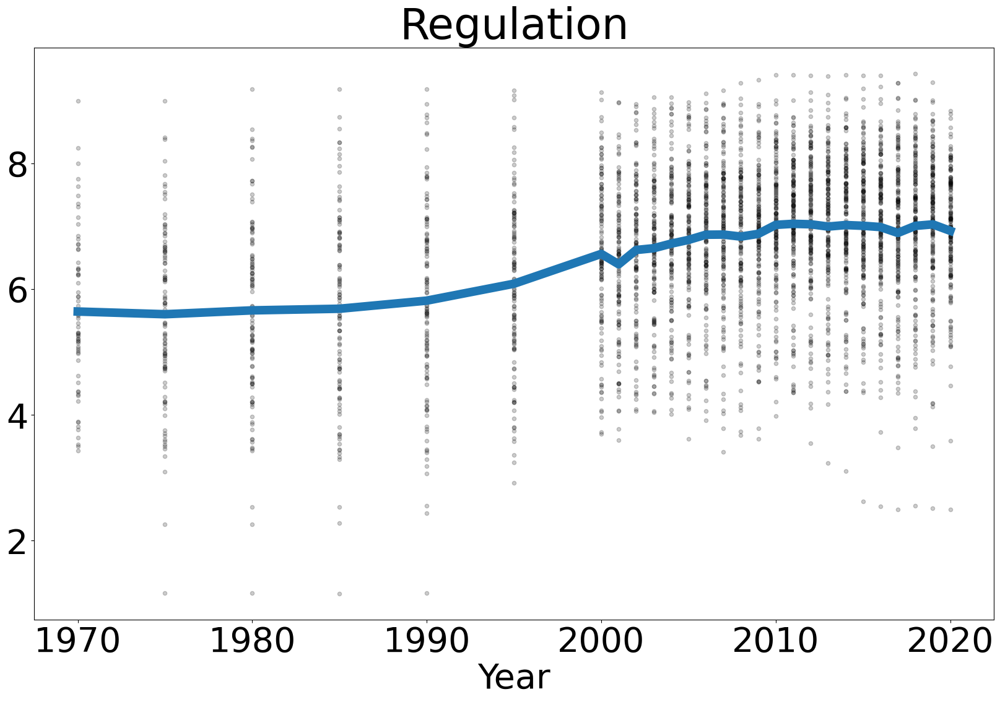

In [44]:
plt.rcParams.update({'font.size': 40})

def plot_ts_scatter(data, pp = None):
    time = data.index.get_level_values("Year")
    for key, val in data.items():
        fig, ax = plt.subplots(figsize = (20,12))
        ax.scatter(time, val, alpha = .2, color = "k", s = 20)
        ax.set_title(key, fontsize = 50)
        mean_data[key].plot(ax = ax, linewidth = 10, color = "C0")
        # omit everything before key to simply save all the graphs without a folder
        plt.savefig(folder + "/" + key + ".jpeg")
        plt.show()
        if pp != None:
            pp.savefig(fig, bbox_inches = "tight")
        plt.close()
plot_ts_scatter(data, pp)

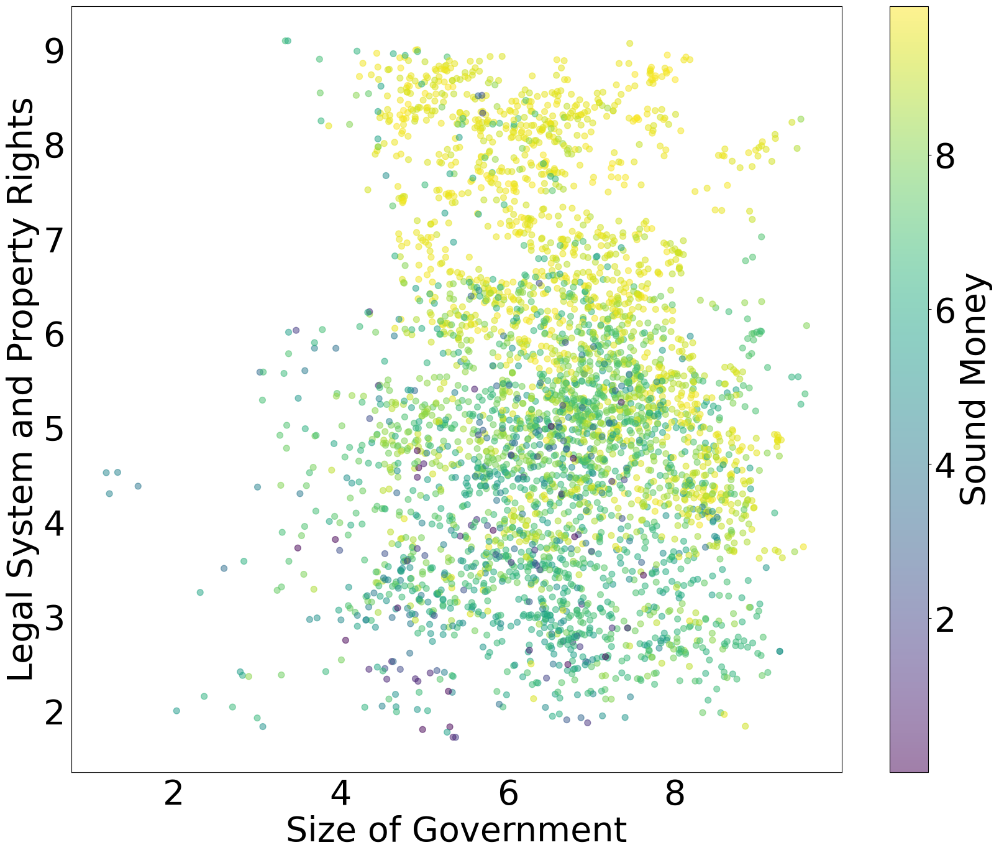

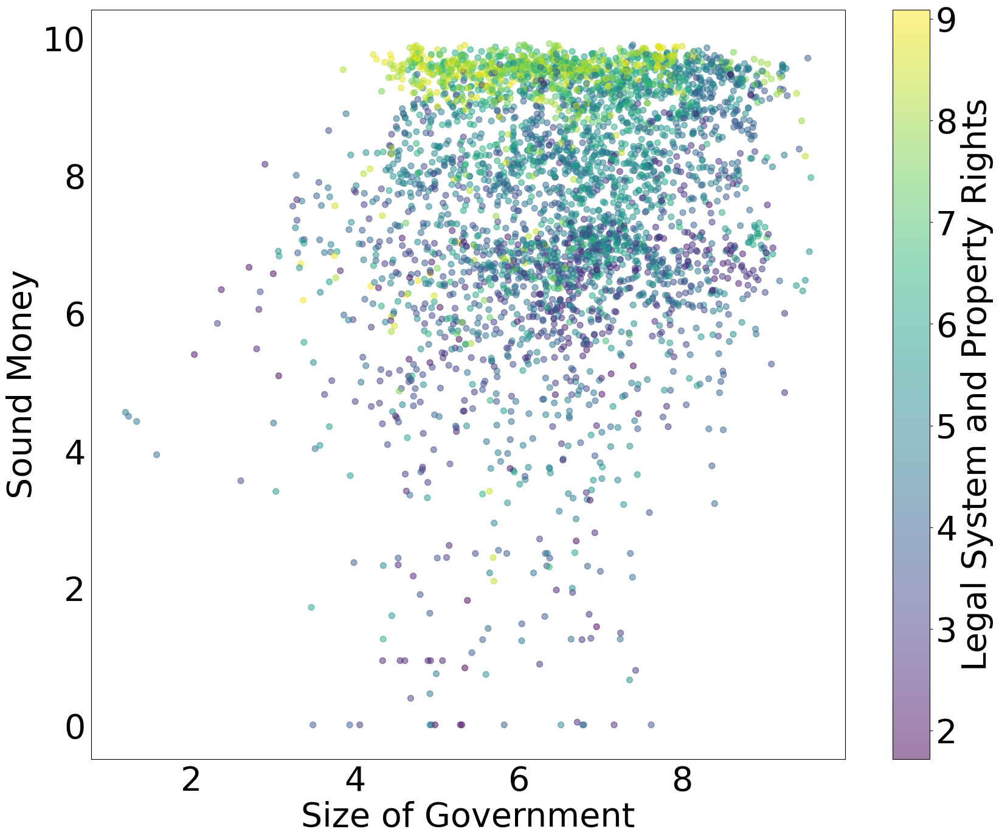

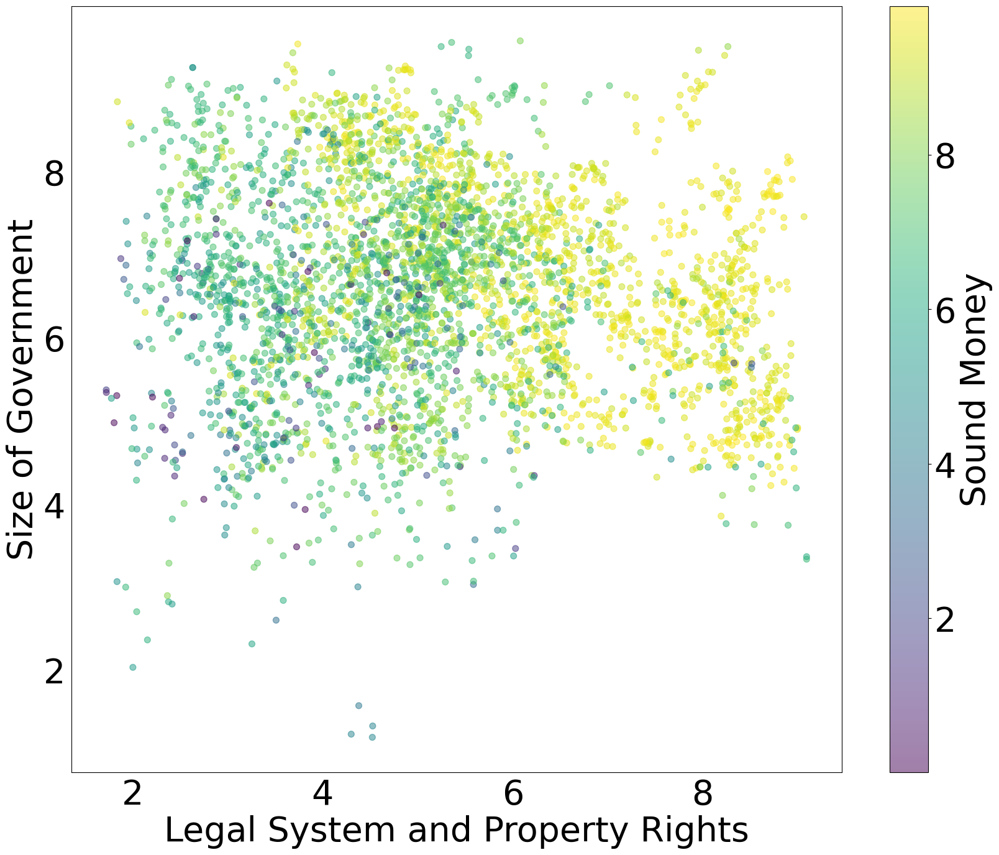

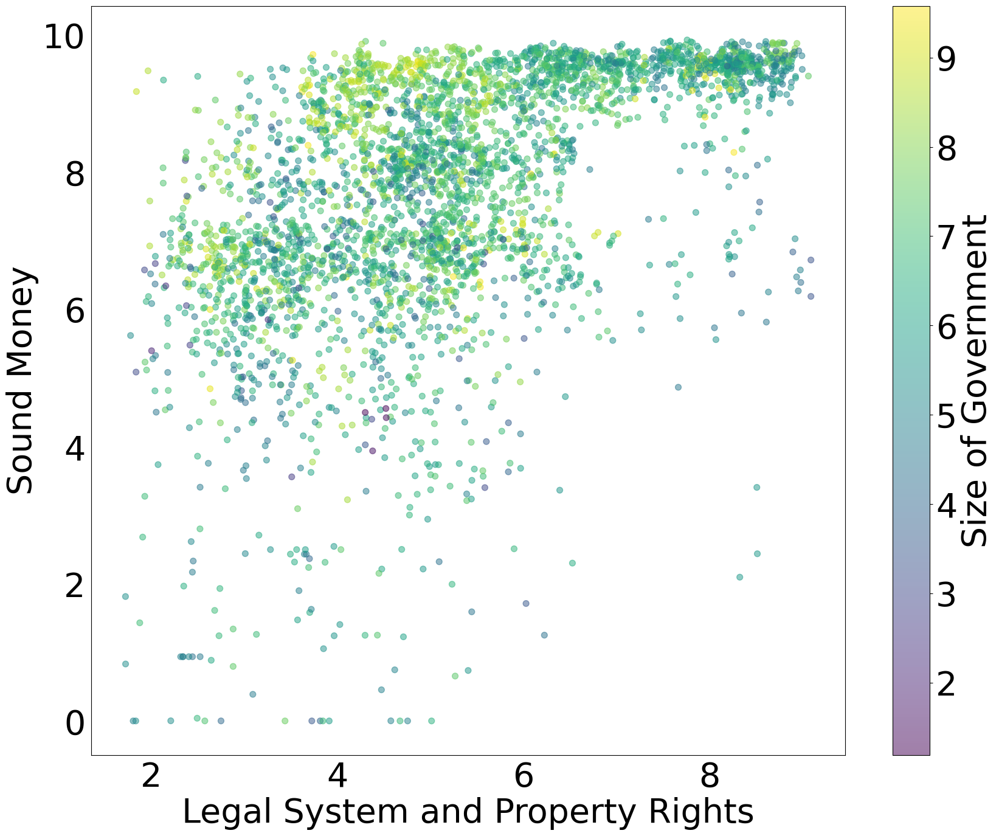

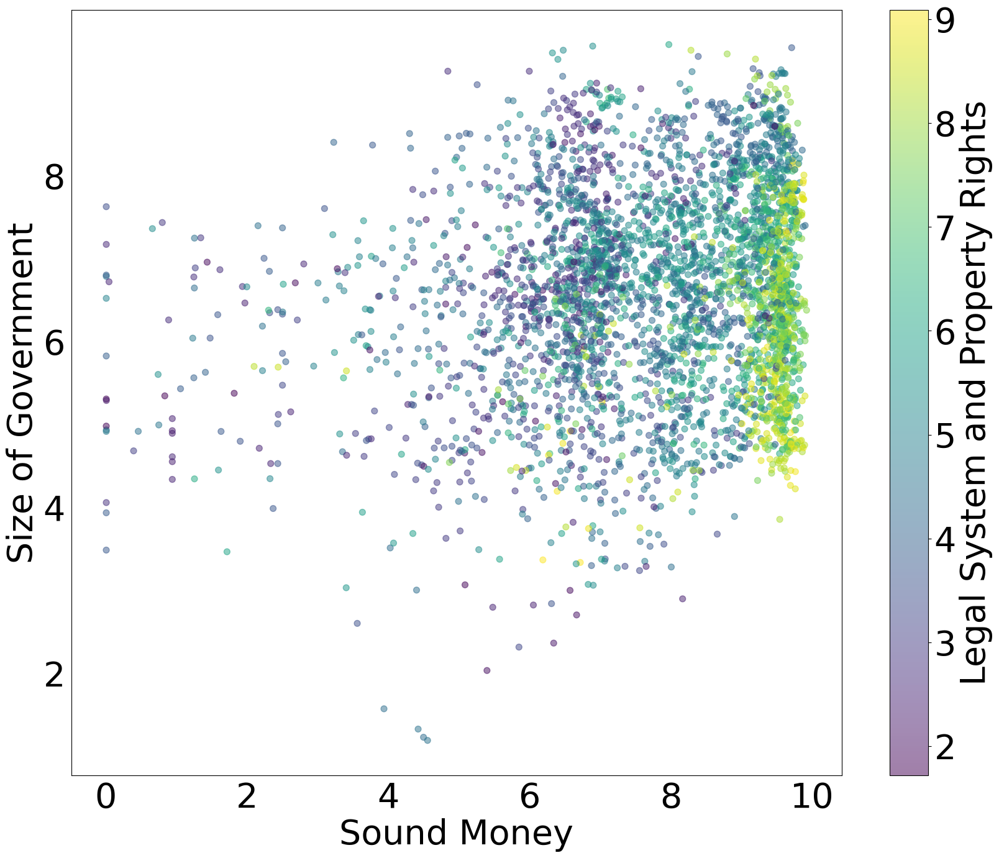

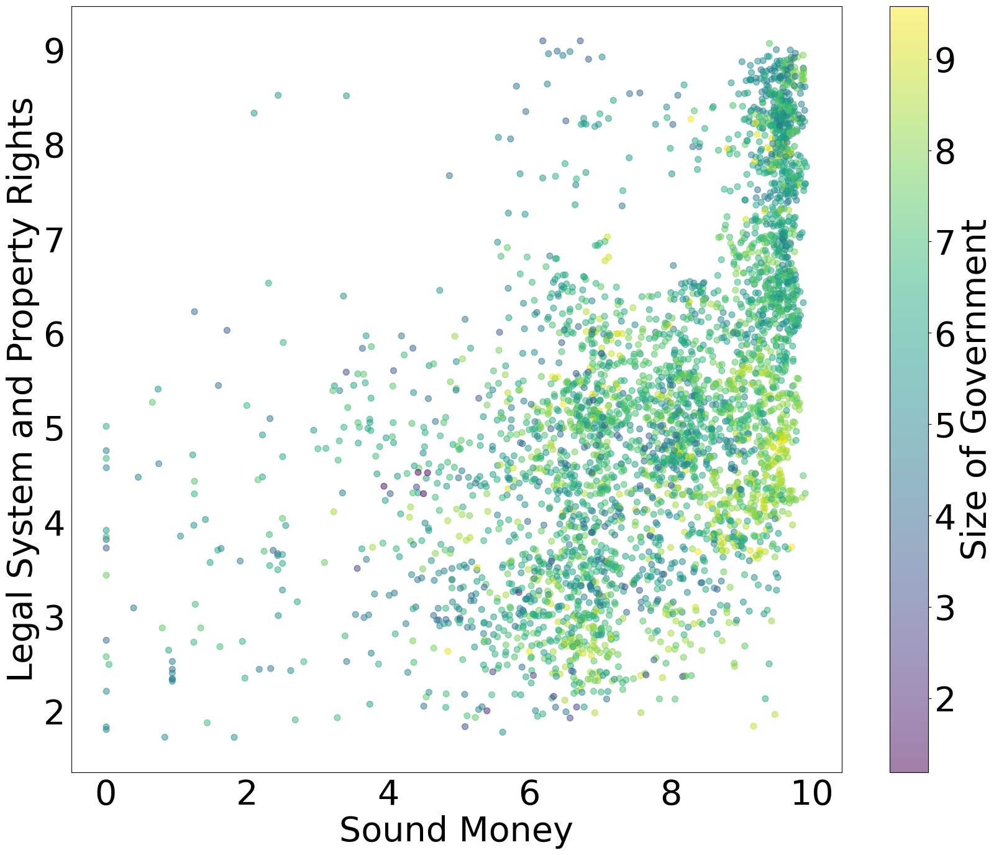

In [45]:



def color_dim_scatter(data, pp):
    for key1 in data:
        for key2 in data:
            # don't plot the same variable on x and y
            if key1 != key2:
                # don't plot the same variable for c, x, y
                for key3 in data:
                    if key1 != key3 and key2 != key3:
                        fig, ax = plt.subplots(figsize = (20,16))
                        data.plot.scatter(x = key1,
                                          y = key2,
                                          c = key3,
                                          colormap = "viridis",
                                          s = 50,
                                          alpha = .5,
                                          ax = ax)

                        # remove the ticklines from the axes
                        plt.setp(ax.get_xticklines(), visible = False)
                        plt.setp(ax.get_yticklines(), visible = False)
                        # show figure
                        plt.show()
                        # save the figure we showed
                        pp.savefig(fig, bbox_inches = "tight")
                        # close the figure
                        plt.close()
                        
color_dim_scatter(data[["Size of Government",
                        "Legal System and Property Rights",
                        "Sound Money"]], pp)
# close the pdf file so that it can be opened                    
pp.close()

C:\Users\jacob\AppData\Local\Temp\ipykernel_18056\4229963058.py:8: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  pd.plotting.scatter_matrix(data,


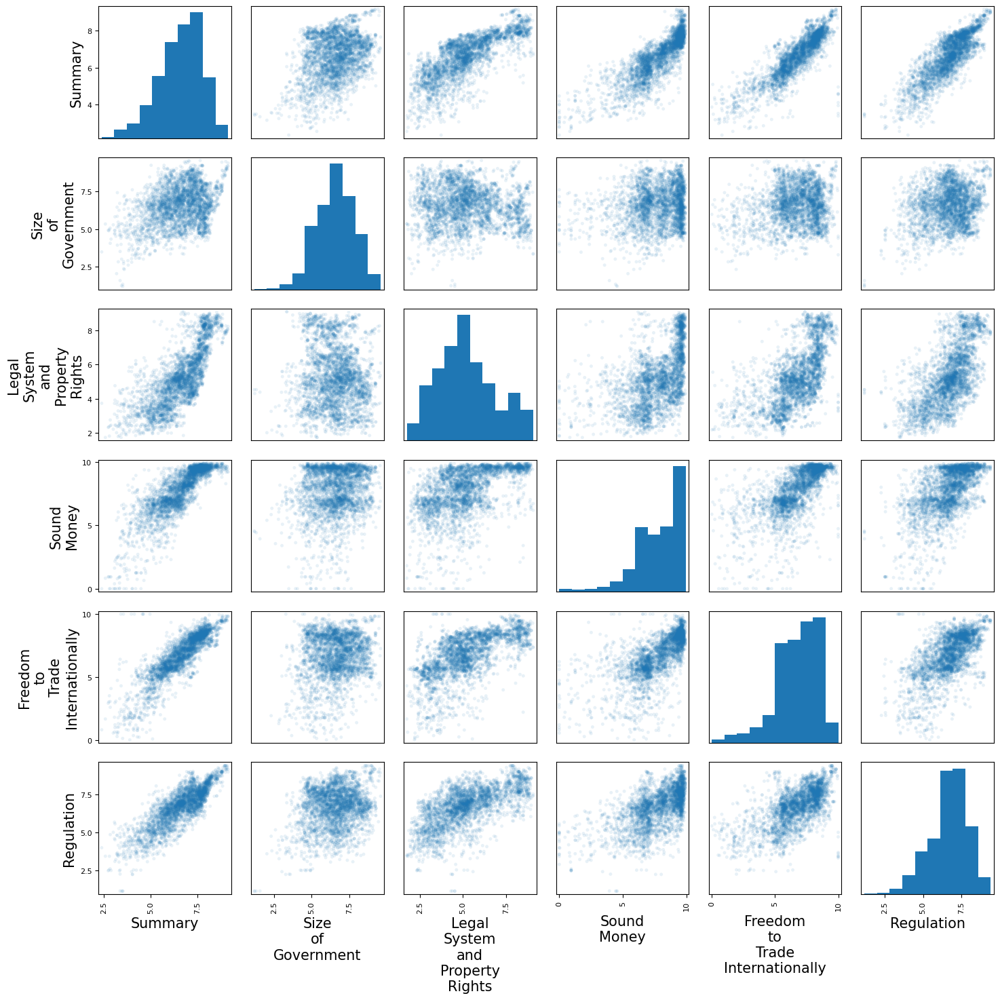

AttributeError: 'NoneType' object has no attribute 'endStream'

In [46]:
def formatted_scatter_matrix(data, pp = None, dim = 15):
    figsize = (dim, dim)
    num_vars = len(data.keys())  
    fontsize = 90 / num_vars
    fig, ax = plt.subplots(figsize = figsize)
    plt.rcParams.update({'font.size': fontsize})
    
    pd.plotting.scatter_matrix(data,
                               alpha = .1,
                               s = 300 / num_vars,
                               ax = ax)
    # separate each squre plot with a margin
    plt.tight_layout()
    plt.show()
    if pp != None:
        # use bbox_inches to avoid cutting off part of figure
        pp.savefig(fig, bbox_inches = "tight")
    plt.close()
    
# replace " " in each key with "\n"    
plot_data = data.rename(
    columns = {key:key.replace(" ", "\n") for key in data.keys()})
formatted_scatter_matrix(plot_data, pp, dim = 15)

# close pdf so it can be opened without corrupting
pp.close()
